In [1]:
import glob

import numpy as np
import pandas as pd
import pandas as pd
from scipy.spatial.distance import squareform, pdist
from tmap.tda import filter
from tmap.tda.basic import *

pd.options.display.expand_frame_repr = False
pd.options.display.max_rows= 1000
pd.options.display.max_columns= 1000

import scipy.stats as scs
import numpy as np
from tmap.netx.SAFE import SAFE_batch,get_SAFE_summary
from tmap.tda.plot import vis_progressX,Color
from tmap.netx.coenrichment_analysis import *
import warnings
import plotly
warnings.filterwarnings('ignore')
plotly.offline.init_notebook_mode()

In [2]:
print(plotly.__version__)

3.4.2


In [3]:

emp_otu = pd.read_csv("emp_subset2k_genus_table.csv",index_col=0,sep='\t')
emp_metadata = pd.read_csv("cleaned.mapping2K.filter.csv",index_col=0)
emp_sub2k_order = pd.read_csv("emp_sub2k_order.csv",index_col=0)
emp_unifrac_dist = pd.read_csv("unifrac_dist_sub2k.csv",index_col=0)
emp_eu_dis = pd.read_csv("eu_dist_sub2k.csv",index_col=0)
metadata_category = pd.read_csv('emp_metadata_category.csv',index_col=0)


In [4]:
emp_unifrac_dist.shape,emp_otu.shape

((2000, 2000), (2000, 1951))

In [5]:
emp_unifrac_dist.to_csv('envfit/envfit_for_dis.csv',index=True)
emp_metadata.to_csv('envfit/envfit_for_metadata.csv',index=True)

In [6]:
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr

importr("vegan")

def envfit_metadata(path_data,metadata_path,return_ord = False):
    rcode = """
    dis <- read.csv('{path_data}',row.names = 1)
    metadata <- read.csv('{path_metadata}',row.names = 1,check.names=FALSE)
    ord <- capscale(dis ~ -1)
    """.format(path_data=path_data,path_metadata=metadata_path)
    robjects.r(rcode)

    envfit_result = robjects.r(
    """
    fit <- envfit(ord,metadata,permutations = 999)
    fit$vectors
    """)
    R_ord = robjects.r('summary(ord)$sites')
    R_pro_X_df = pd.DataFrame(data=np.array(R_ord),index=R_ord.rownames,columns=R_ord.colnames)
    fit_result = pd.DataFrame(columns=["r2","pvals","Source","End"],index=envfit_result[envfit_result.names.index("arrows")].rownames)
    fit_result.loc[:,"r2"] = envfit_result[envfit_result.names.index("r")]
    fit_result.loc[:, "pvals"] = envfit_result[envfit_result.names.index("pvals")]
    fit_result.loc[:, ["Source","End"]] = np.array(envfit_result[envfit_result.names.index("arrows")])
    if return_ord:
        return fit_result,R_pro_X_df
    else:
        return fit_result

t1 = time.time()
fit_result,R_pro_X_df = envfit_metadata('envfit/envfit_for_dis.csv',
                                     'envfit/envfit_for_metadata.csv',
                                    return_ord=True)
print('envfit takes', time.time() - t1)

envfit takes 514.6519432067871


In [7]:
graph, graph_name, projected_X = generate_graph(emp_otu,
                                                emp_unifrac_dist,
                                                eps_threshold=95,
                                                overlap_params=0.85,
                                                resolution_params=50,
                                                filter_=filter.PCOA,
                                                _eu_dm=pd.DataFrame(emp_eu_dis))

Filtering by PCOA.
...calculate distance matrix using the precomputed metric.


  0%|          | 0/2500 [00:00<?, ?it/s]

Finish filtering of points cloud data.
projection takes:  2.9475669860839844
Mapping on data (2000, 1951) using lens (2000, 2)
...minimal number of points in hypercube to do clustering: 3


100%|██████████| 2500/2500 [00:01<00:00, 1423.53it/s]


...create 1056 nodes.
...calculate projection coordinates of nodes.
...construct a TDA graph.
...create 7360 edges.
Finish TDA mapping
Graph covers 79.20 percentage of samples.
graph time:  4.142547607421875


In [8]:
from tmap.netx.SAFE import SAFE_batch,get_SAFE_summary
from tmap.tda.plot import vis_progressX,Color
n_iter = 5000
enriched_SAFE_metadata = SAFE_batch(graph,meta_data = emp_metadata,n_iter=n_iter,_cal_type='df')

100%|██████████| 5000/5000 [13:42<00:00,  6.08it/s]


In [9]:
enriched_SAFE = SAFE_batch(graph,meta_data = emp_otu,n_iter=n_iter,_cal_type='df')

100%|██████████| 5000/5000 [1:04:29<00:00,  1.29it/s]


In [10]:
safe_summary_metadata = get_SAFE_summary(graph=graph, meta_data=emp_metadata, safe_scores=enriched_SAFE_metadata,
                                n_iter_value=n_iter, p_value=0.05)
safe_summary = get_SAFE_summary(graph=graph, meta_data=emp_otu, safe_scores=enriched_SAFE,
                                n_iter_value=n_iter, p_value=0.05)

In [11]:
safe_summary.sort_values('SAFE enriched score',ascending=False).to_csv('result/EMP Genus SAFE summary.csv')
compared_table = safe_summary_metadata
compared_table.loc[:,'Category'] = metadata_category.loc[safe_summary_metadata.index,'Category']
compared_table.sort_values('SAFE enriched score',ascending=False).to_csv('result/EMP covariate SAFE summary.csv')

In [12]:
enriched_SAFE_total = {**enriched_SAFE,**enriched_SAFE_metadata}
safe_summary_total = pd.concat([safe_summary_metadata,safe_summary],axis=0)

In [13]:
safe_df = pd.DataFrame(enriched_SAFE_total)
metadata_category = metadata_category.reindex(safe_df.columns)
metadata_category.loc[metadata_category.index.isin(emp_otu.columns), 'Category'] = 'Genus'

## Draw PCoA which is based on SAFE score (For both Metadata and Genus)

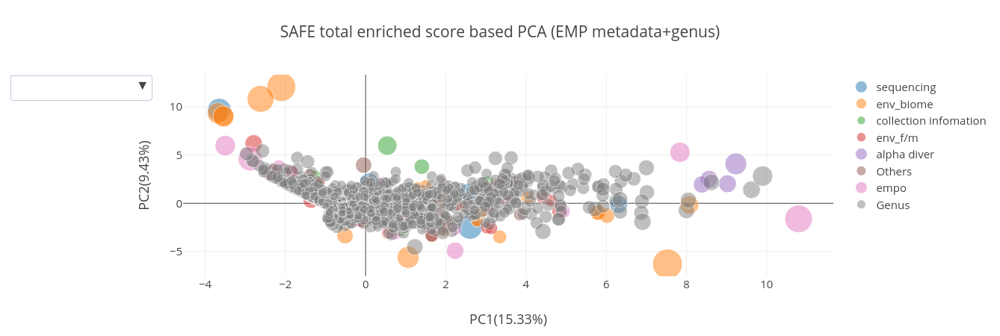

In [14]:
input_otu = emp_otu
metadata_category = metadata_category

from sklearn.decomposition import PCA
import plotly
from plotly import graph_objs as go
from sklearn.preprocessing import MinMaxScaler

pca = PCA()
pca_result = pca.fit_transform(safe_df.T)

top_metadata = list(safe_summary_metadata.sort_values('SAFE enriched score', ascending=False).index[:10])
top_genus = list(safe_summary.sort_values('SAFE enriched score', ascending=False).index[:10])
mx_scale = MinMaxScaler(feature_range=(10, 40)).fit(safe_summary_total.loc[:, ["SAFE enriched score"]])

data = []
for cat in set(metadata_category.loc[:, 'Category']):
    vals = safe_summary_total.loc[metadata_category.index[metadata_category.Category == cat], ["SAFE enriched score"]]
    data.append(go.Scatter(x=pca_result[metadata_category.Category == cat, 0],
                           y=pca_result[metadata_category.Category == cat, 1],
                           mode="markers",
                           # legendgroup=''
                           name=cat,
                           marker=dict(#color=color_codes[cat],
                               size=mx_scale.transform(vals),
                               opacity=0.5),
                           text=metadata_category.index[metadata_category.Category == cat]))

data.append(go.Scatter(x=pca_result[:,0],
                       y=pca_result[:,1],
                       #visible=False,
                       mode="text",
                       hoverinfo='none',
                       textposition="middle center",
                       name='name for searching',
                       showlegend=False,
                       textfont=dict(size=13),
                        text=''))

traces_index = {trace.name: idx for idx, trace in enumerate(data) if trace['name'] in metadata_category.Category.unique()}
reset_buttons = [dict(args=[{'text':[' ']},{},str(len(data)-1)], label='ClearAll', method='update')]
all_buttons = [dict(args=[{'text':[safe_df.columns]},{},str(len(data)-1)], label='ShowAll', method='update')]

updatemenus = [dict(active=-1,
                    #xanchor='right',
                    #type='buttons',
                    buttons=[dict(args=['text',[_trace.text for _trace in data if _trace.name in traces_index] + [[each if metadata_category.loc[each,'Category'] ==cat else ' ' for each in safe_df.columns]]
                                       ]
                                  , label=cat, method='restyle') for cat in metadata_category.Category.unique().tolist()] + reset_buttons + all_buttons,
                    ),
               ]

layout = dict(xaxis=dict(title="PC1({:.2f}%)".format(pca.explained_variance_ratio_[0] * 100)),
              yaxis=dict(title="PC2({:.2f}%)".format(pca.explained_variance_ratio_[1] * 100)),
              title="SAFE total enriched score based PCA (EMP metadata+genus)",
              font=dict(size=15),
              hovermode='closest',
              updatemenus=updatemenus)
#plotly.offline.iplot(dict(data=data, layout=layout), )
plotly.offline.plot(dict(data=data,layout=layout),filename="result/SAFE total enriched score based PCA.html",auto_open=False)
plotly.offline.iplot(dict(data=data,layout=layout))

## Ranking comparison between safe and envfit.

In [15]:
compared_table = pd.DataFrame(columns=['SAFE enriched score','R'],index=safe_summary_metadata.sort_values('SAFE enriched score',ascending=False).index)
compared_table.loc[:,'SAFE enriched score'] = list(safe_summary_metadata.sort_values('SAFE enriched score',ascending=False).loc[:,'SAFE enriched score'])
compared_table.loc[:,'R'] = list(fit_result.reindex(safe_summary_metadata.sort_values('SAFE enriched score',ascending=False).index).loc[:,'r2'])
compared_table = compared_table.fillna(0)
compared_table.to_csv('result/Ranking comparison of safe and envfit.csv',index=True)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y1 ]



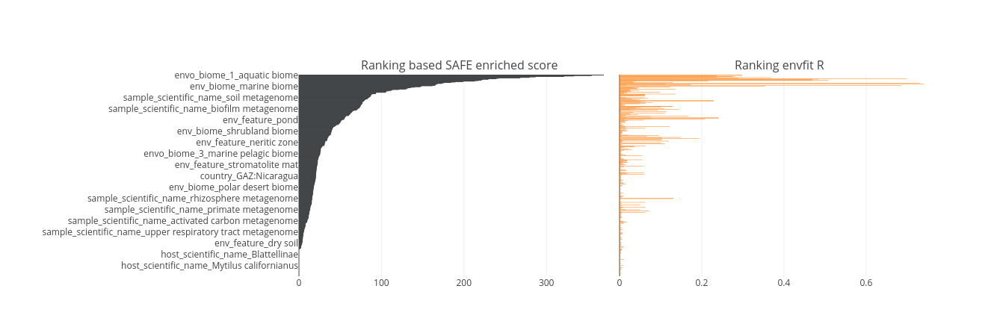

'file:///home/liaoth/data2/project/TDA_paper/ipython_notebook/package_notebook/EMP/result/fig5a.compared Bar plot.html'

In [17]:
from plotly import tools
fig = tools.make_subplots(1,2,shared_yaxes=True,horizontal_spacing=0,subplot_titles=['Ranking based SAFE enriched score',
                                                                                    'Ranking envfit R'])

sorted_df = safe_summary_metadata.sort_values('SAFE enriched score',ascending=False)
fig.append_trace(go.Bar(x = compared_table.loc[:,'SAFE enriched score'],
                        y = compared_table.index, 
                       marker=dict(#color = [color_codes[metadata_category.loc[fea,'Category']] for fea in sorted_df.index],
                                  line=dict(width=1)),
                        orientation = 'h',
                       showlegend=False),1,1)
fig.append_trace(go.Bar(x=compared_table.loc[:,'R'],
                        y=compared_table.index, 
                        orientation = 'h',
                       showlegend=False),1,2)

fig.layout.yaxis.autorange= 'reversed'
fig.layout.margin.l = 400
fig.layout.height = 1500
plotly.offline.iplot(fig)
plotly.offline.plot(fig,filename='result/fig5a.compared Bar plot.html',auto_open=False)


## coenrichment analysis

In [18]:
from tmap.netx.coenrichment_analysis import *
from tmap.netx.SAFE import construct_node_data

In [19]:
min_p_value = 1.0 / (n_iter + 1.0)
SAFE_pvalue = np.log10(0.05) / np.log10(min_p_value)
enriched_centroides, enriched_nodes = get_enriched_nodes(graph,pd.DataFrame.from_dict(enriched_SAFE_total, orient='index'), SAFE_pvalue, centroids=True)

node_data = construct_node_data(graph, emp_otu)
nodes_metadata = construct_node_data(graph, emp_metadata)

### generate global and local correlative features

In [20]:
for fea in [_ for _ in emp_metadata.columns if "empo_2" in _]:  ## demo
    global_correlative_feas, sub_correlative_feas, metainfo = coenrichment_for_nodes(graph,
                                                                                     enriched_centroides[fea],
                                                                                     fea,
                                                                                     enriched_centroides,
                                                                                    _filter=True,
                                                                                    mode='both')
    global_corr_df, sub_corr_df = construct_correlative_metadata(fea, global_correlative_feas, sub_correlative_feas, metainfo, pd.concat([node_data, 
                                                                                                                                          nodes_metadata],axis=1),verbose=0)
    global_corr_df.loc[global_corr_df.loc[:,'ranksum in co-enriched nodes'] < 0.05,:].sort_values('fisher-exact test pvalue',ascending=True).to_csv('result/coenrichment/%s_global_corr.csv' % fea,index=False)
    sub_corr_df.loc[(sub_corr_df.comps_size >= 10) & (sub_corr_df.loc[:,'coenriched-others pvalue'] < 0.05),:].sort_values(['n_comps','coenriched-others pvalue'],ascending=True).to_csv('result/coenrichment/%s_sub_corr.csv' % fea,index=False)
    

### generate pairwise matrix which contains the coenriched p-value. 

In [21]:
fe_dis = pairwise_coenrichment(graph,enriched_SAFE_total,_pre_cal_enriched=enriched_centroides)

  0%|          | 0/2383 [00:00<?, ?it/s]

building network...


100%|██████████| 2383/2383 [4:23:32<00:00,  6.64s/it]


In [22]:
fe_dis = pairwise_coenrichment(graph,enriched_SAFE_total,_pre_cal_enriched=enriched_centroides)
from statsmodels.sandbox.stats.multicomp import multipletests
corrected_fe_dis = pd.DataFrame(multipletests(fe_dis.values.reshape(-1,), method='fdr_bh')[1].reshape(fe_dis.shape),
                                index=fe_dis.index,
                                columns=fe_dis.columns)

  0%|          | 0/2383 [00:00<?, ?it/s]

building network...


100%|██████████| 2383/2383 [4:08:20<00:00,  6.25s/it]


### Extract significant correlative relationship between empo_2 and genus

In [23]:
import networkx as nx
import itertools
edges = []
for f1,f2 in tqdm(itertools.product([_ for _ in emp_metadata.columns if _.startswith('empo_2')],
                                    list(emp_otu.columns))):
    if corrected_fe_dis.loc[f1,f2] <= 0.05:
        edges.append((f1,f2,{'weight': 1- fe_dis.loc[f1,f2]}))

7804it [00:00, 52568.49it/s]


In [33]:
G = nx.from_edgelist(edges)
file_path = 'result/empo2_genus.edges'
nx.write_edgelist(G,file_path,delimiter=';;;')
import pandas as pd
edge_df = pd.read_csv(file_path,sep=';;;',header=None)
edge_df.index = range(edge_df.shape[0])

all_nodes = list(set(list(edge_df.iloc[:,0]) + list(edge_df.iloc[:,1])))
node_df = pd.DataFrame(index=all_nodes,columns=['cat'] )
for idx in range(edge_df.shape[0]):
    source_name = edge_df.iloc[idx,0]
    end_name = edge_df.iloc[idx,1]
    
    edge_df.loc[idx,'weight'] = -np.log(fe_dis.loc[source_name,end_name])
    node_df.loc[source_name,"cat"] = metadata_category.loc[source_name,'Category']
    node_df.loc[end_name,"cat"] = metadata_category.loc[end_name,'Category']
    
node_df.index.name = 'feature'
edge_df = edge_df.drop([2],axis=1)
edge_df.columns = ['Source','End','weight']
edge_df.to_csv(file_path,index=False,sep='\t')
node_df.to_csv(file_path.replace('edge','node'),sep='\t')

### Co-enrichment relationship between all empo level

In [24]:
import networkx as nx
import itertools
edges = []
for f1,f2 in tqdm(itertools.combinations([_ for _ in emp_metadata.columns if _.startswith('empo_')],2)):
    if corrected_fe_dis.loc[f1,f2] <= 0.05:
        edges.append((f1,f2,{'weight': 1- fe_dis.loc[f1,f2]}))

276it [00:00, 84963.52it/s]


In [25]:
# manually assign the categorical of empo level according to which empo level 2 it belongs.
cat_dict = {'empo_3_Plant corpus': 'Plant',
 'empo_3_Hypersaline (saline)': 'Saline',
 'empo_3_Animal distal gut': 'Animal',
 'empo_3_Soil (non-saline)': 'Non-Saline',
 'empo_3_Animal corpus': 'Animal',
 'empo_2_Animal': 'Animal',
 'empo_3_Sediment (non-saline)': 'Non-Saline',
 'empo_3_Water (non-saline)': 'Non-Saline',
 'empo_3_Surface (saline)': 'Saline',
 'empo_3_Sediment (saline)': 'Saline',
 'empo_3_Plant surface': 'Plant',
 'empo_3_Aerosol (non-saline)': 'Non-Saline',
 'empo_2_Non-saline': 'Non-Saline',
 'empo_3_Animal proximal gut': 'Animal',
 'empo_3_Animal secretion': 'Animal',
 'empo_2_Saline': 'Saline',
 'empo_3_Surface (non-saline)': 'Non-Saline',
 'empo_3_Plant rhizosphere': 'Plant',
 'empo_2_Plant': 'Plant',
 'empo_3_Animal surface': 'Animal',
 'empo_1_Free-living': 'EMPO1',
 'empo_3_Water (saline)': 'Saline',
 'empo_1_Host-associated': 'EMPO1'}

In [26]:
## For empo
G = nx.from_edgelist(edges)
file_path = 'result/All_empo.edges'
nx.write_edgelist(G,file_path,delimiter=';;;')
import pandas as pd
edge_df = pd.read_csv(file_path,sep=';;;',header=None)
edge_df.index = range(edge_df.shape[0])

all_nodes = list(set(list(edge_df.iloc[:,0]) + list(edge_df.iloc[:,1])))
node_df = pd.DataFrame(index=all_nodes,columns=['cat'] )
for idx in range(edge_df.shape[0]):
    source_name = edge_df.iloc[idx,0]
    end_name = edge_df.iloc[idx,1]
    
    edge_df.loc[idx,'weight'] = -np.log(fe_dis.loc[source_name,end_name])
    edge_df.loc[idx,'type'] = 'same level' if edge_df.loc[idx,0].split('_')[2] == edge_df.loc[idx,1].split('_')[2] else 'diff level'
    
node_df.index.name = 'feature'
node_df.loc[:,'cat'] = [cat_dict.get(_,'') for _ in node_df.index]
edge_df = edge_df.drop([2],axis=1)
edge_df.columns = ['Source','End','weight','type']
edge_df.to_csv(file_path,index=False,sep='\t')
node_df.to_csv(file_path.replace('edge','node'),sep='\t')

### Co-enrichment relationship between all possible host 

In [27]:
import networkx as nx
import itertools
edges = []
for f1,f2 in tqdm(itertools.combinations([_ for _ in emp_metadata.columns if _.startswith('host_scientific_name')],2)):
    if corrected_fe_dis.loc[f1,f2] <= 0.05:
        edges.append((f1,f2,{'weight': 1- fe_dis.loc[f1,f2]}))

4560it [00:00, 103766.46it/s]


In [28]:
type_dict = {'host_scientific_name_Zonotrichia capensis': 'bird',
 'host_scientific_name_Acropora': 'aquatic',
 'host_scientific_name_Rhinopithecus roxellana': 'mammalia',
 'host_scientific_name_Melursus ursinus': 'mammalia',
 'host_scientific_name_Saltator maximus': 'bird',
 'host_scientific_name_Clamator glandarius': 'bird',
 'host_scientific_name_Myrmecophaga tridactyla': 'mammalia',
 'host_scientific_name_Oryza sativa': 'plant',
 'host_scientific_name_Rusa unicolor': 'mammalia',
 'host_scientific_name_Varanus komodoensis': 'amphibians',
 'host_scientific_name_Columbina passerina': 'bird',
 'host_scientific_name_Ramphocelus carbo': 'bird',
 'host_scientific_name_Rattus norvegicus': 'mammalia',
 'host_scientific_name_Anthopleura elegantissima': 'aquatic',
 'host_scientific_name_Globicephala macrorhynchus': 'aquatic',
 'host_scientific_name_Ecklonia radiata': 'aquatic',
 'host_scientific_name_Columbina talpacoti': 'bird',
 'host_scientific_name_Hexapoda': 'insect',
 'host_scientific_name_Rhinopithecus brelichi': 'mammalia',
 'host_scientific_name_Pygathrix nemaeus': 'mammalia',
 'host_scientific_name_Phyllospora comosa': 'aquatic',
 'host_scientific_name_Montastraea annularis': 'aquatic',
 'host_scientific_name_Ateles geoffroyi': 'mammalia',
 'host_scientific_name_Gila robusta': 'aquatic',
 'host_scientific_name_Crotalus viridis viridis': 'aquatic',
 'host_scientific_name_Syncerus caffer caffer': 'mammalia',
 'host_scientific_name_Porites': 'aquatic',
 'host_scientific_name_Phaeophyceae': 'aquatic',
 'host_scientific_name_Platycichla flavipes': 'bird',
 'host_scientific_name_Thraupis palmarum': 'bird',
 'host_scientific_name_Ictalurus punctatus': 'aquatic',
 'host_scientific_name_Rhodophyta': 'aquatic',
 'host_scientific_name_Proteles cristatus': 'mammalia',
 'host_scientific_name_Nasalis larvatus': 'mammalia',
 'host_scientific_name_Chiroxiphia lanceolata': 'bird',
 'host_scientific_name_Varanus olivaceus': 'amphibians',
 'host_scientific_name_Trachypithecus auratus': 'mammalia',
 'host_scientific_name_Iguana iguana': 'amphibians',
 'host_scientific_name_Pocillopora verrucosa': 'aquatic',
 'host_scientific_name_Catostomus discobolus': 'aquatic',
 'host_scientific_name_Catostomus': 'aquatic',
 'host_scientific_name_Choloepus hoffmanni': 'mammalia',
 'host_scientific_name_Bos taurus': 'mammalia',
 'host_scientific_name_Pemphiginae': 'insect',
 'host_scientific_name_Columbidae': 'bird',
 'host_scientific_name_Homo sapiens': 'mammalia',
 'host_scientific_name_Cannabis sativa': 'plant',
 'host_scientific_name_Canis lupus familiaris': 'mammalia'}

In [29]:
## For host specific
G = nx.from_edgelist(edges)
file_path = 'result/all_host.edges'
nx.write_edgelist(G,file_path,delimiter=';;;')
import pandas as pd
edge_df = pd.read_csv(file_path,sep=';;;',header=None)
edge_df.index = range(edge_df.shape[0])

all_nodes = list(set(list(edge_df.iloc[:,0]) + list(edge_df.iloc[:,1])))
node_df = pd.DataFrame(index=all_nodes,columns=['s_name'] )
for idx in range(edge_df.shape[0]):
    source_name = edge_df.iloc[idx,0]
    end_name = edge_df.iloc[idx,1]
    
    edge_df.loc[idx,'weight'] = -np.log(fe_dis.loc[source_name,end_name])
node_df.loc[:,'s_name'] = [_.partition('scientific_name_')[2] for _ in node_df.index]
node_df.loc[:,'cat'] = [type_dict.get(_,'') for _ in node_df.index]
node_df.index.name = 'feature'
edge_df = edge_df.drop([2],axis=1)
edge_df.columns = ['Source','End','weight']
edge_df.to_csv(file_path,index=False,sep='\t')
node_df.to_csv(file_path.replace('edge','node'),sep='\t')

In [30]:
## https://github.com/tctianchi/pyvenn
# draw the venn
# labels = venn.get_labels([_ for _ in empo2genus_dict.values()], fill=['number', 'logic'])
# fig, ax = venn.venn4(labels, names=[_ for _ in empo2genus_dict.keys()])

In [31]:
import plotly.io as pio

## Stratification with empo level 2.

This is the format of your plot grid:
[ (1,1) x1,y1 ]



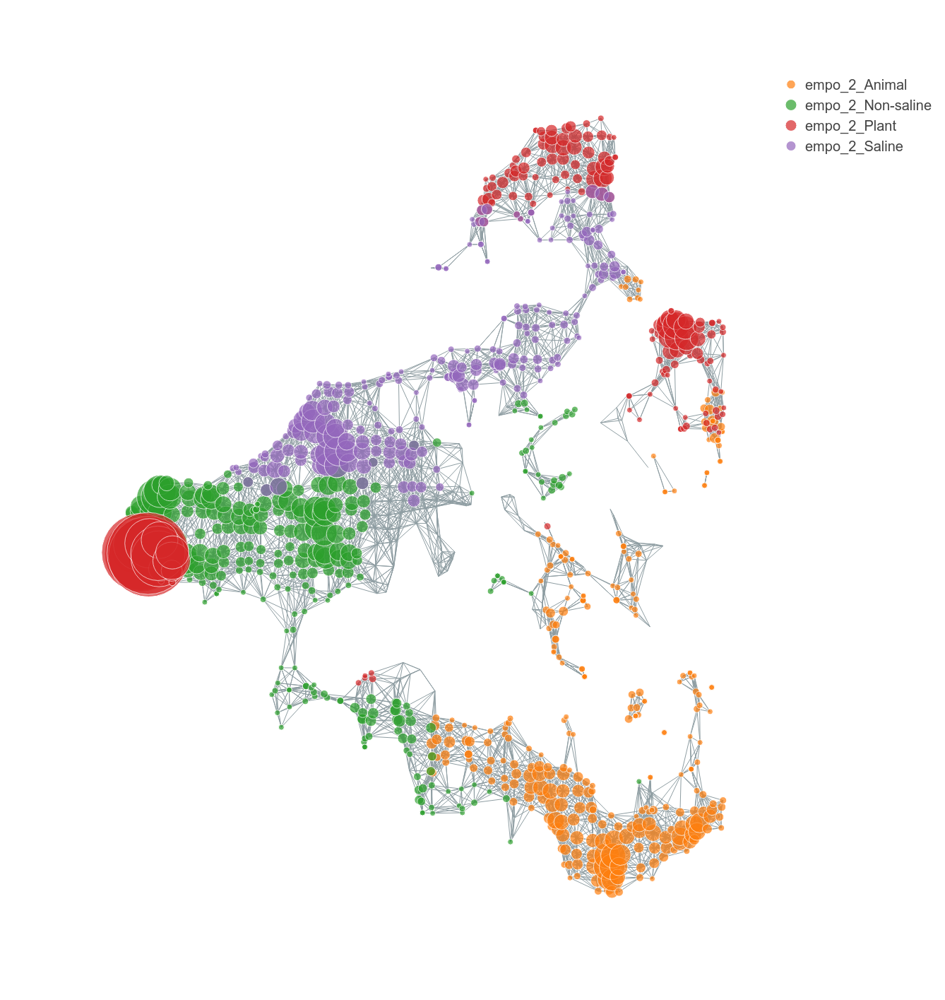

In [32]:
node_pos = graph["node_positions"]
nodes = graph["nodes"]
sizes = graph["node_sizes"][:,0]
xs = []
ys = []
for edge in graph["edges"]:
    xs += [node_pos[edge[0], 0],
           node_pos[edge[1], 0],
           None]
    ys += [node_pos[edge[0], 1],
           node_pos[edge[1], 1],
           None]
fig = plotly.tools.make_subplots(1,1)


node_line = go.Scatter(
    # ordination line
    visible=True,
    x=xs,
    y=ys,
    marker=dict(color="#8E9DA2",
                opacity=0.7),
    line=dict(width=1),
    showlegend=False,
    mode="lines")
fig.append_trace(node_line, 1, 1)


for idx,fea in enumerate([_ for _ in emp_metadata.columns if _.startswith('empo_2')]):
    min_p_value = 1.0 / (5000 + 1.0)
    SAFE_pvalue = np.log10(0.05) / np.log10(min_p_value)
    # transforming the p-value 0.05 into a comparable values which match SAFE scores.
    tmp1 = {k:v if enriched_SAFE_total[fea][k]>= SAFE_pvalue else np.nan for k,v in enriched_SAFE_total[fea].items()}
    node_position = go.Scatter(
        # node position
        visible=True,
        x=node_pos[[k for k,v in enriched_SAFE_total[fea].items() if not np.isnan(tmp1[k])], 0],
        y=node_pos[[k for k,v in enriched_SAFE_total[fea].items() if not np.isnan(tmp1[k])], 1],
        hoverinfo="text",
        marker=dict(
                    size=[5 + sizes[_] for _ in [k for k,v in enriched_SAFE_total[fea].items() if not np.isnan(tmp1[k])]],
                    opacity=0.7),
        showlegend=True,
        name = fea,
        mode="markers")
    fig.append_trace(node_position, 1,1)
fig.layout.width = 1600
fig.layout.height = 1400
fig.layout.font.size = 20
fig.layout.xaxis.zeroline = False
fig.layout.yaxis.zeroline = False
fig.layout.xaxis.showticklabels = False
fig.layout.yaxis.showticklabels = False
fig.layout.xaxis.showgrid = False
fig.layout.yaxis.showgrid = False
fig.layout.font.family = "Arial"
fig.layout.hovermode = 'closest'
plotly.offline.plot(fig,filename='result/Stratification with EMPO 2.html',auto_open=False)
plotly.offline.iplot(fig)